# Comparacion de gaussiana vs Gauss-Jordan

[06-24 20:15:12][INFO] 
[[ 7.18457718e-02  3.09590583e+00  3.90705468e+00  9.28676495e+00
   9.02974948e+00  1.54958364e+00]
 [ 0.00000000e+00 -1.82891789e+02 -2.24942450e+02 -5.48582250e+02
  -5.33812922e+02 -8.59490316e+01]
 [ 0.00000000e+00 -1.77872472e+02 -2.32201425e+02 -5.57170907e+02
  -5.42654404e+02 -8.52987408e+01]
 [ 0.00000000e+00 -3.12999933e+02 -3.99644210e+02 -9.45684428e+02
  -9.16607110e+02 -1.56334983e+02]
 [ 0.00000000e+00 -1.93654314e+02 -2.49024514e+02 -5.99146442e+02
  -5.84600778e+02 -1.01166916e+02]]
[06-24 20:15:12][INFO] 
[[ 7.18457718e-02  3.09590583e+00  3.90705468e+00  9.28676495e+00
   9.02974948e+00  1.54958364e+00]
 [ 0.00000000e+00 -1.77872472e+02 -2.32201425e+02 -5.57170907e+02
  -5.42654404e+02 -8.52987408e+01]
 [ 0.00000000e+00  2.84217094e-14  1.38113803e+01  2.43112545e+01
   2.41544441e+01  1.75672257e+00]
 [ 0.00000000e+00  0.00000000e+00  8.95769316e+00  3.47621512e+01
   3.82949632e+01 -6.23587054e+00]
 [ 0.00000000e+00  0.00000000e+00  3.77912

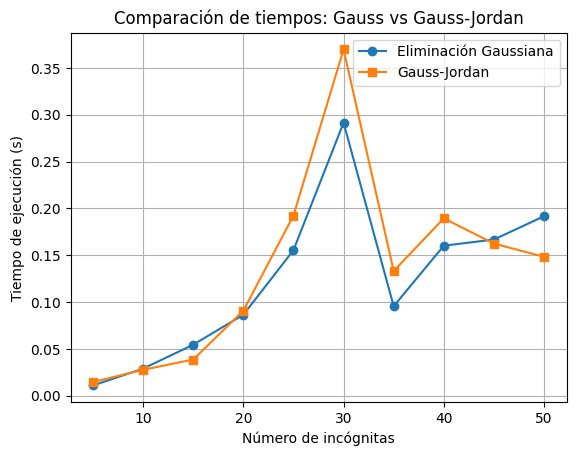

In [12]:


from src import eliminacion_gaussiana, gauss_jordan
import numpy as np
import time
import matplotlib.pyplot as plt

incognitas = list(range(5, 51, 5))
tiempos_gauss = []
tiempos_jordan = []

for n in incognitas:
    A = np.random.rand(n, n) * 10
    b = np.random.rand(n) * 10
    Ab = np.hstack((A, b.reshape(-1, 1)))

    # Gauss
    t0 = time.time()
    eliminacion_gaussiana(Ab.copy())
    t1 = time.time()
    tiempos_gauss.append(t1 - t0)

    # Gauss-Jordan
    t0 = time.time()
    gauss_jordan(Ab.copy())
    t1 = time.time()
    tiempos_jordan.append(t1 - t0)

# Graficar
plt.plot(incognitas, tiempos_gauss, label="Eliminación Gaussiana", marker='o')
plt.plot(incognitas, tiempos_jordan, label="Gauss-Jordan", marker='s')
plt.xlabel("Número de incógnitas")
plt.ylabel("Tiempo de ejecución (s)")
plt.title("Comparación de tiempos: Gauss vs Gauss-Jordan")
plt.grid(True)
plt.legend()
plt.show()


[06-24 20:15:19][INFO] 
[[ 4.54516363  3.65287723  2.85828976  1.99999362  4.12426978  3.77970521]
 [ 0.         -4.18845416  5.2465678   2.85432665  2.13038099  1.71344584]
 [ 0.         -5.56917222 -3.85008586 -1.38252975 -3.33526117  0.30683022]
 [ 0.         -5.74186504 -3.05407281 -0.82514103  0.01211767  1.11520835]
 [ 0.          0.86943219 -1.2252637   0.72228773 -3.71605682  3.02683424]]
[06-24 20:15:19][INFO] 
[[  4.54516363   3.65287723   2.85828976   1.99999362   4.12426978
    3.77970521]
 [  0.           0.86943219  -1.2252637    0.72228773  -3.71605682
    3.02683424]
 [  0.           0.         -11.69854678   3.24410453 -27.13856707
   19.69530163]
 [  0.           0.         -11.14590435   3.9449592  -24.52929796
   21.10489117]
 [  0.           0.          -0.65609016   6.33391838 -15.77157133
   16.29509647]]


[06-24 20:15:19][INFO] 
[[   4.54516363    3.65287723    2.85828976    1.99999362    4.12426978
     3.77970521]
 [   0.            0.86943219   -1.2252637     0.72228773   -3.71605682
     3.02683424]
 [   0.            0.           -0.65609016    6.33391838  -15.77157133
    16.29509647]
 [   0.            0.            0.         -103.65800839  243.40403745
  -255.72228463]
 [   0.            0.            0.         -109.69409323  254.07958797
  -270.85767314]]
[06-24 20:15:19][INFO] 
[[ 4.54516363e+00  3.65287723e+00  2.85828976e+00  1.99999362e+00
   4.12426978e+00  3.77970521e+00]
 [ 0.00000000e+00  8.69432191e-01 -1.22526370e+00  7.22287734e-01
  -3.71605682e+00  3.02683424e+00]
 [ 0.00000000e+00  0.00000000e+00 -6.56090162e-01  6.33391838e+00
  -1.57715713e+01  1.62950965e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.03658008e+02
   2.43404037e+02 -2.55722285e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  -3.49805213e+00 -2.44484945e-01]]


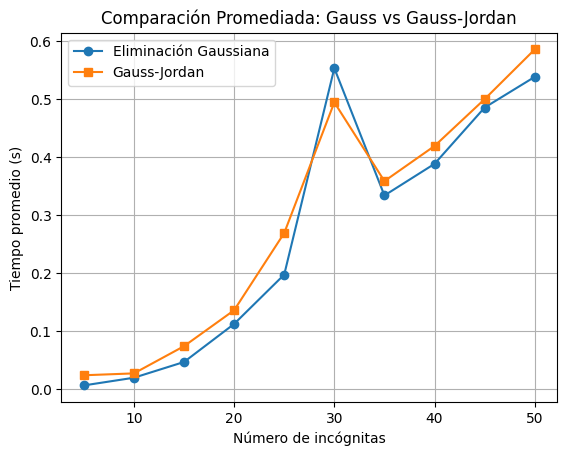

In [13]:
import numpy as np
import time
import matplotlib.pyplot as plt
from src import eliminacion_gaussiana, gauss_jordan

def medir_tiempo_promedio(func, Ab, repeticiones=5):
    tiempos = []
    for _ in range(repeticiones):
        inicio = time.time()
        func(Ab.copy())
        tiempos.append(time.time() - inicio)
    return np.mean(tiempos)

incognitas = list(range(5, 51, 5))
tiempos_gauss = []
tiempos_jordan = []

for n in incognitas:
    A = np.random.rand(n, n) * 10
    b = np.random.rand(n) * 10
    Ab = np.hstack((A, b.reshape(-1, 1)))

    tiempos_gauss.append(medir_tiempo_promedio(eliminacion_gaussiana, Ab))
    tiempos_jordan.append(medir_tiempo_promedio(gauss_jordan, Ab))

plt.plot(incognitas, tiempos_gauss, label="Eliminación Gaussiana", marker='o')
plt.plot(incognitas, tiempos_jordan, label="Gauss-Jordan", marker='s')
plt.xlabel("Número de incógnitas")
plt.ylabel("Tiempo promedio (s)")
plt.title("Comparación Promediada: Gauss vs Gauss-Jordan")
plt.legend()
plt.grid(True)
plt.show()


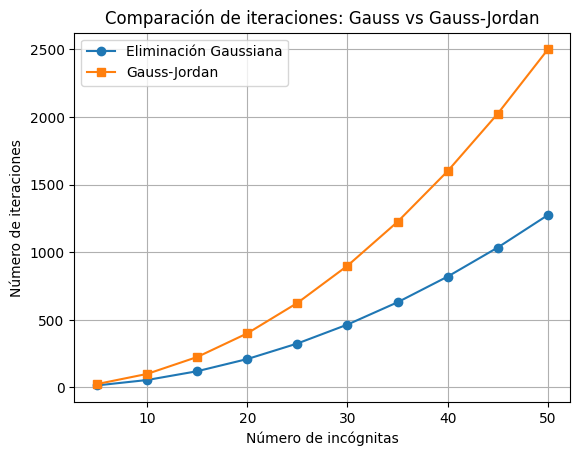

In [ ]:
# Funciones para contar operaciones/interacciones en lugar de medir tiempo

def eliminacion_gaussiana_contador(Ab):
    Ab = np.array(Ab, dtype=float)
    n = Ab.shape[0]
    iteraciones = 0
    for i in range(n):
        max_row = np.argmax(np.abs(Ab[i:, i])) + i
        Ab[[i, max_row]] = Ab[[max_row, i]]
        for j in range(i + 1, n):
            factor = Ab[j, i] / Ab[i, i]
            Ab[j, i:] -= factor * Ab[i, i:]
            iteraciones += 1  # Cada fila reducida cuenta como una interacción
    for i in range(n - 1, -1, -1):
        _ = (Ab[i, -1] - np.dot(Ab[i, i + 1:n], np.zeros(n - i - 1))) / Ab[i, i]
        iteraciones += 1  # Cada sustitución hacia atrás cuenta como otra iteración
    return iteraciones

def gauss_jordan_contador(Ab):
    Ab = np.array(Ab, dtype=float)
    n = Ab.shape[0]
    iteraciones = 0
    for i in range(n):
        max_row = np.argmax(np.abs(Ab[i:, i])) + i
        Ab[[i, max_row]] = Ab[[max_row, i]]
        Ab[i] = Ab[i] / Ab[i, i]
        iteraciones += 1  # Normalizar fila
        for j in range(n):
            if j != i:
                Ab[j] -= Ab[i] * Ab[j, i]
                iteraciones += 1  # Reducir fila
    return iteraciones

# Calcular número de iteraciones
incognitas = list(range(5, 51, 5))
iter_gauss = []
iter_jordan = []

for n in incognitas:
    A = np.random.rand(n, n) * 10
    b = np.random.rand(n) * 10
    Ab = np.hstack((A, b.reshape(-1, 1)))

    iter_gauss.append(eliminacion_gaussiana_contador(Ab.copy()))
    iter_jordan.append(gauss_jordan_contador(Ab.copy()))

# Graficar el número de iteraciones
plt.plot(incognitas, iter_gauss, marker='o', label='Eliminación Gaussiana')
plt.plot(incognitas, iter_jordan, marker='s', label='Gauss-Jordan')
plt.xlabel('Número de incógnitas')
plt.ylabel('Número de iteraciones')
plt.title('Comparación de iteraciones: Gauss vs Gauss-Jordan')
plt.legend()
plt.grid(True)
plt.show()
